<a href="https://colab.research.google.com/github/konrad98ft/cutting-inserts-detection/blob/master/MobileNET_inserts_deepl.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **MobileNET model traning**

---




---











# Preparing base model
---



## Imports

In [ ]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

In [ ]:
import urllib.request
import os
import zipfile
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras import models
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt
import numpy as np

## Building model

In [ ]:
# IMG_SIZE is determined by EfficientNet model choice
       
        # Coefficients:   width,depth,res,dropout
       # 'efficientnet-b0': (1.0, 1.0, 224, 0.2),
       # 'efficientnet-b1': (1.0, 1.1, 240, 0.2),
       # 'efficientnet-b2': (1.1, 1.2, 260, 0.3),
       # 'efficientnet-b3': (1.2, 1.4, 300, 0.3),
       # 'efficientnet-b4': (1.4, 1.8, 380, 0.4),
       # 'efficientnet-b5': (1.6, 2.2, 456, 0.4),
       # 'efficientnet-b6': (1.8, 2.6, 528, 0.5),
       # 'efficientnet-b7': (2.0, 3.1, 600, 0.5),
        
IMG_SIZE = 224
input_shape=(IMG_SIZE, IMG_SIZE, 3)

base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape,include_top=False,weights='imagenet')
base_model.trainable = False

model = tf.keras.Sequential([
  base_model,
  tf.keras.layers.Conv2D(128, 3, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.GlobalAveragePooling2D(),
  tf.keras.layers.Dense(1, activation='sigmoid')
])




model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['acc'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 7, 7, 1280)        2257984   
_________________________________________________________________
conv2d (Conv2D)              (None, 5, 5, 128)         1474688   
_________________________________________________________________
dropout (Dropout)            (None, 5, 5, 128)         0         
_________________________________________________________________
global_average_pooling2d (Gl (None, 128)               0         
_________________________________________________________________
dense (Dense)                (None, 1)                 129       
Total params: 3,732,801
Trainable params: 1,474,817
Non-trainable params: 2,257,984
_________________________________________________________________



## Get data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data_set_path = '/content/drive/MyDrive/cutting-inserts-samples/DATA_SET_8/'
extract_folder_path = '/content/DATA_SET_8/'
#TRANING
training_file_name = data_set_path + "traning.zip"
training_dir = extract_folder_path + 'traning/'
zip_ref = zipfile.ZipFile(training_file_name, 'r')
zip_ref.extractall(training_dir)
zip_ref.close()

#VALIDATION
validation_file_name = data_set_path + "validation.zip"
validation_dir = extract_folder_path + 'validation/'
zip_ref = zipfile.ZipFile(validation_file_name, 'r')
zip_ref.extractall(validation_dir)
zip_ref.close()

#TEST
test_file_name = data_set_path + "test.zip"
test_dir = extract_folder_path + 'test/'
zip_ref = zipfile.ZipFile(test_file_name, 'r')
zip_ref.extractall(test_dir)
zip_ref.close()





In [ ]:
# Resizing images in all directiories
from os import listdir
from PIL import Image

pathes = (training_dir,validation_dir,test_dir)
size = (IMG_SIZE, IMG_SIZE)

for path in pathes:
  print(path)
  sub_floders = os.listdir(path)
  print(sub_floders)
  for folder in sub_floders:
    images = os.listdir(path + folder + '/')
    for image in images:
      img = Image.open(path + folder + '/' + image)  
      img = img.resize(size)
      img.save(path + folder + '/' + image)

/content/DATA_SET_8/traning/
['samples_faulty', 'samples_good']
/content/DATA_SET_8/validation/
['samples_faulty', 'samples_good']
/content/DATA_SET_8/test/
['samples_faulty', 'samples_good']


## Augumentaion 

In [ ]:
# Add our data-augmentation parameters to ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255.,
                                   zoom_range=0.05,
                                   width_shift_range=0.1, 
                                   height_shift_range=0.1, 
                                   horizontal_flip=True,
                                   vertical_flip=True,  
                                   rotation_range=5)



# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1.0/255.)

# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_directory(training_dir,
                                                    batch_size=20,
                                                    class_mode='binary',
                                                    target_size=(IMG_SIZE, IMG_SIZE))

# Flow validation images in batches of 20 using test_datagen generator
validation_generator =  test_datagen.flow_from_directory(validation_dir,
                                                         batch_size=20,
                                                         class_mode='binary',
                                                         target_size=(IMG_SIZE, IMG_SIZE))





Found 224 images belonging to 2 classes.
Found 97 images belonging to 2 classes.


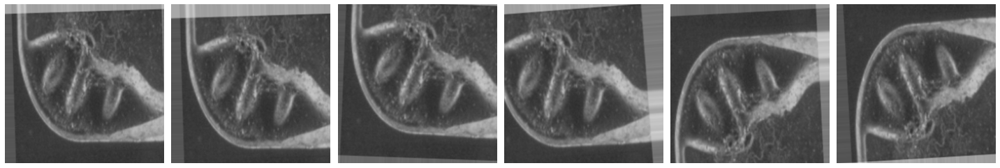

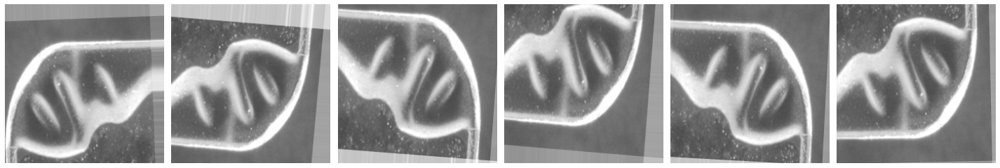

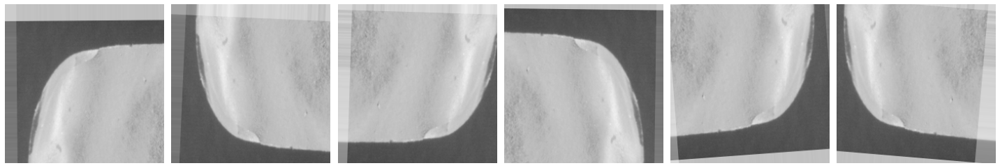

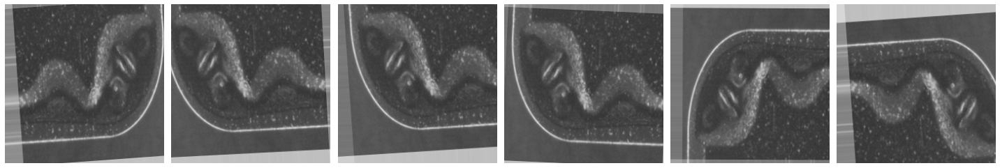

In [ ]:
#Example augumentation
def plotImages(images_arr):
    fig, axes = plt.subplots(1, 6, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('Off')
    plt.tight_layout()
    plt.show()
    
for j in range(4):
  augmented_images = [train_generator[0][0][j] for i in range(6) ]
  plotImages(augmented_images)


## Model fit

In [ ]:
history = model.fit(
            train_generator,
            validation_data=validation_generator,
            epochs=20,
            verbose=2)

Epoch 1/20
12/12 - 8s - loss: 2.6310 - acc: 0.5670 - val_loss: 0.5408 - val_acc: 0.6701
Epoch 2/20
12/12 - 3s - loss: 0.4401 - acc: 0.8571 - val_loss: 0.2669 - val_acc: 0.8866
Epoch 3/20
12/12 - 3s - loss: 0.3059 - acc: 0.8705 - val_loss: 0.2274 - val_acc: 0.8866
Epoch 4/20
12/12 - 3s - loss: 0.2171 - acc: 0.9152 - val_loss: 0.2153 - val_acc: 0.9072
Epoch 5/20
12/12 - 3s - loss: 0.1844 - acc: 0.9330 - val_loss: 0.1783 - val_acc: 0.9072
Epoch 6/20
12/12 - 3s - loss: 0.2301 - acc: 0.9152 - val_loss: 0.1980 - val_acc: 0.9175
Epoch 7/20
12/12 - 3s - loss: 0.1852 - acc: 0.9420 - val_loss: 0.2307 - val_acc: 0.9175
Epoch 8/20
12/12 - 3s - loss: 0.1964 - acc: 0.9152 - val_loss: 0.1916 - val_acc: 0.9175
Epoch 9/20
12/12 - 3s - loss: 0.1486 - acc: 0.9330 - val_loss: 0.1730 - val_acc: 0.9278
Epoch 10/20
12/12 - 3s - loss: 0.1463 - acc: 0.9464 - val_loss: 0.1572 - val_acc: 0.9588
Epoch 11/20
12/12 - 3s - loss: 0.1454 - acc: 0.9509 - val_loss: 0.1969 - val_acc: 0.9278
Epoch 12/20
12/12 - 3s - loss:

# Base model results

---



## Accuracy and los visualization

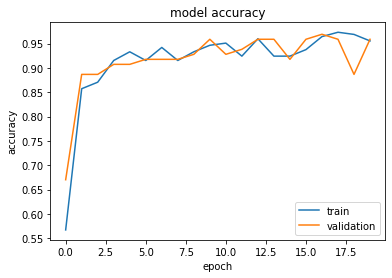

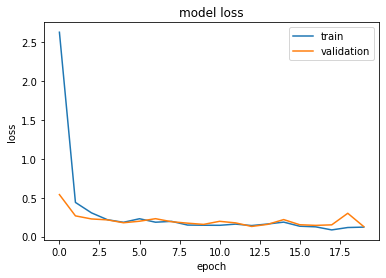

In [ ]:
import matplotlib.pyplot as plt

# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

## Example samples

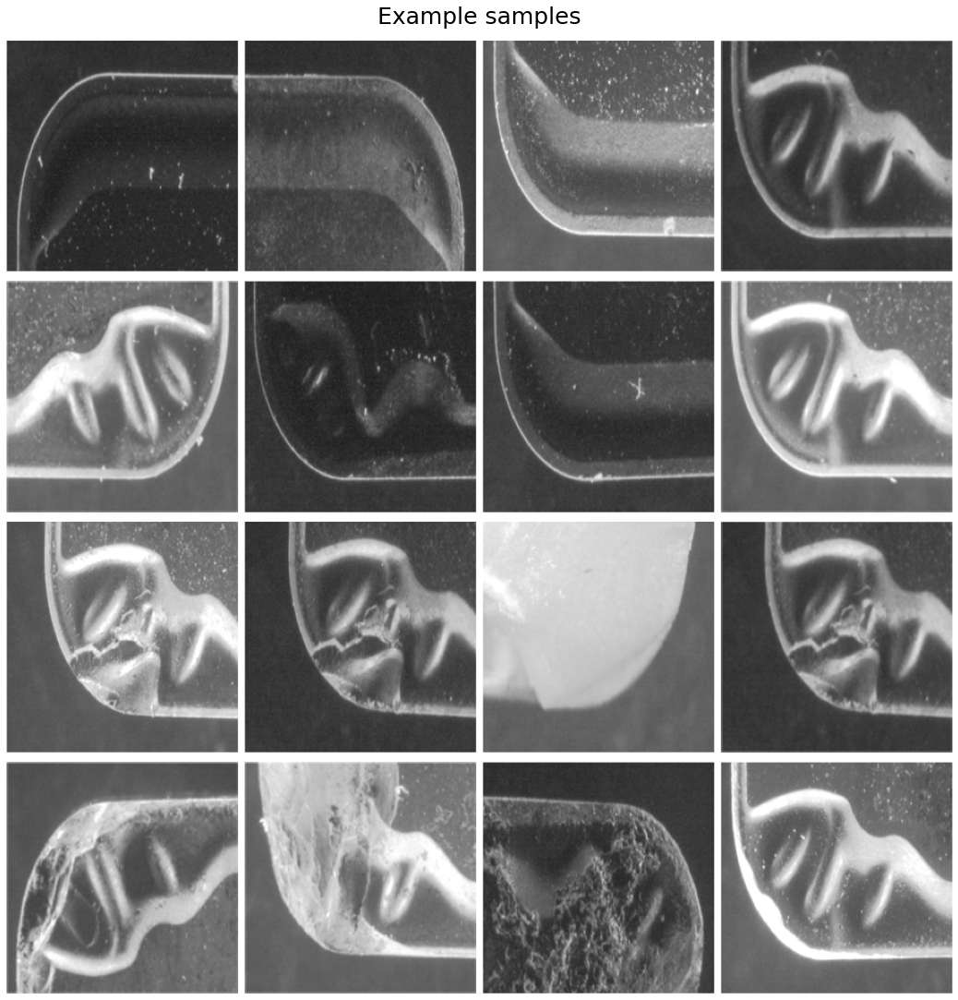

In [ ]:
#import numpy as np
from google.colab import files
from keras.preprocessing import image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

test_good_inserts_names = os.listdir(test_dir+'samples_good')
test_faulty_inserts_names = os.listdir(test_dir+'samples_faulty')

%matplotlib inline
# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 0

# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)


pic_index += 8
next_good_pix = [os.path.join(test_dir+'samples_good', fname) 
                for fname in test_good_inserts_names[pic_index-8:pic_index]]
next_faulty_pix = [os.path.join(test_dir+'samples_faulty', fname) 
                for fname in test_faulty_inserts_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_good_pix + next_faulty_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)
fig.suptitle("Example samples",fontsize=25)
plt.tight_layout(pad=6, w_pad=0.5, h_pad=1.0)
plt.show()

In [ ]:
next_good_pix = [os.path.join(test_dir + 'samples_good', fname) 
                for fname in test_good_inserts_names[:]]
next_faulty_pix = [os.path.join(test_dir + 'samples_faulty', fname) 
                for fname in test_faulty_inserts_names[:]]

uploaded = next_faulty_pix + next_good_pix

classification = []

for fn in uploaded:
  img = image.load_img(fn, target_size=size)
  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x/=255
  image_tensor = np.vstack([x])
  classes = model.predict(image_tensor)
  classification.append(classes)




## Results

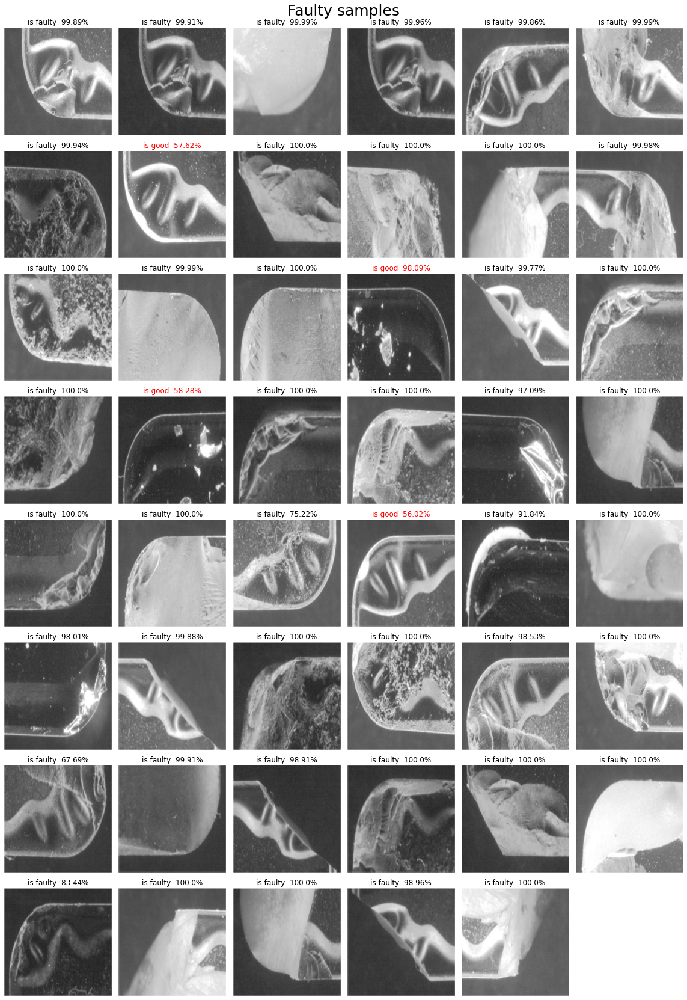

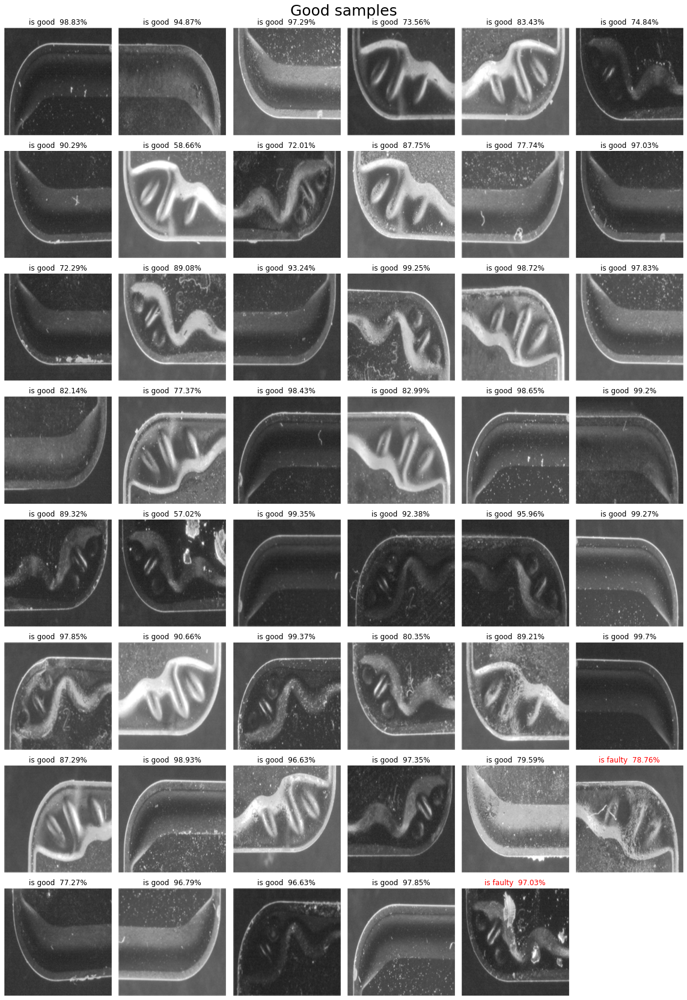

In [ ]:
false_faulty_identification = 0 
true_faulty_identification = 0 
n_cols = 6
n_rows = int(len(next_faulty_pix)/n_cols + n_cols)
fig = plt.gcf()
fig.set_size_inches(n_cols * 3, n_rows * 3)

for i, img_path in enumerate(next_faulty_pix):
  if classification[i] > 0.5:
    title =  "is good  " + str(round(float((classification[i])*100),2)) + "%"
    params = {"text.color" : "red"}
    plt.rcParams.update(params)
    false_faulty_identification += 1
  else:
    title =  "is faulty  " + str(round(float((1-classification[i])*100),2)) + "%"
    params = {"text.color" : "black"}
    plt.rcParams.update(params)
    true_faulty_identification +=1
 
  sp = plt.subplot(n_rows, n_cols, i + 1)
  sp.title.set_text(title)
  sp.axis('Off') # Don't show axes (or gridlines)
  img = mpimg.imread(img_path)
  plt.imshow(img)

params = {"text.color" : "black"}
plt.rcParams.update(params)
fig.suptitle("Faulty samples",fontsize=25)
plt.tight_layout(pad=8,w_pad=0.5, h_pad=1.0)
plt.show()

false_good_identification = 0
true_good_identification = 0
n_cols = 6
n_rows = int(len(next_good_pix)/n_cols + n_cols)
fig = plt.gcf()
fig.set_size_inches(n_cols * 3, n_rows * 3)

for j, img_path in enumerate(next_good_pix):
  

  if classification[j+i+1] > 0.5:
    true_good_identification +=1
    title =  "is good  " + str(round(float((classification[j+i+1])*100),2)) + "%"
    params = {"text.color" : "black"}
    plt.rcParams.update(params)
  else:
    title =  "is faulty  " + str(round(float((1-classification[j+i+1])*100),2)) + "%"
    false_good_identification +=1
    params = {"text.color" : "red"}
    plt.rcParams.update(params)
  
  sp = plt.subplot(n_rows, n_cols, j + 1)
  sp.title.set_text(title)
  sp.axis('Off') # Don't show axes (or gridlines)
  img = mpimg.imread(img_path)
  plt.imshow(img)

params = {"text.color" : "black"}
plt.rcParams.update(params)
fig.suptitle("Good samples",fontsize=25)
plt.tight_layout(pad=8,w_pad=0.5, h_pad=1.0)
plt.show()

In [ ]:
wrong_identification = false_good_identification + false_faulty_identification
correct = len(uploaded)-wrong_identification
accuracy = correct/len(uploaded)*100
PPV = true_good_identification/(true_good_identification + false_good_identification)*100
NPV = true_faulty_identification/(true_faulty_identification + false_faulty_identification)*100

print("Number of test images:",len(uploaded))
print("Identified corectly:",correct)
print("Identified incorectly:",wrong_identification)



print("PPV {:.2f}%".format(PPV))
print("NPV {:.2f}%".format(NPV))
print("Overall ccuracy: {:.2f}%".format(accuracy))

Number of test images: 94
Identified corectly: 88
Identified incorectly: 6
PPV 95.74%
NPV 91.49%
Overall ccuracy: 93.62%


## Result charts

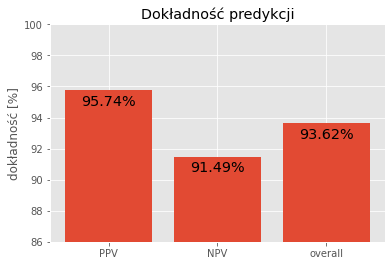

In [ ]:
# function to add value labels
def addlabels(x,y):
    for i in range(len(x)):
        y_txt = "{:.2f}%".format(y[i])
        plt.text(i, y[i]-1, y_txt, ha = 'center', fontsize="x-large")

plt.style.use('ggplot')

x = ['PPV', 'NPV', 'overall']
precent = [PPV,NPV,accuracy]

x_pos = [i for i, _ in enumerate(x)]

fig = plt.bar(x_pos, precent)
plt.ylabel("dokładność [%]")
plt.title("Dokładność predykcji")
plt.ylim(int(min(PPV,NPV)-5),100)
plt.xticks(x_pos, x)
addlabels(x, precent)


plt.show()



# **Fine tuning**

---



---



### Accuracy and los visualization (fine tuning)

In [ ]:
# Unfreeze the base model
base_model.trainable = True

# It's important to recompile your model after you make any changes
# to the `trainable` attribute of any inner layer, so that your changes
# are take into account
model.compile(optimizer=keras.optimizers.Adam(1e-5),  # Very low learning rate
              loss=keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['acc'])


# Train end-to-end. Be careful to stop before you overfit!
history = model.fit(
            train_generator,
            validation_data=validation_generator,
            initial_epoch=20,
            epochs=40,
            verbose=2)

Epoch 21/40


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:5017: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  '"`binary_crossentropy` received `from_logits=True`, but the `output`'


12/12 - 9s - loss: 4.0326 - acc: 0.4509 - val_loss: 0.1179 - val_acc: 0.9691
Epoch 22/40
12/12 - 4s - loss: 3.3236 - acc: 0.4509 - val_loss: 0.1273 - val_acc: 0.9691
Epoch 23/40
12/12 - 4s - loss: 2.4438 - acc: 0.4911 - val_loss: 0.1498 - val_acc: 0.9381
Epoch 24/40
12/12 - 4s - loss: 1.5190 - acc: 0.5580 - val_loss: 0.1781 - val_acc: 0.9278
Epoch 25/40
12/12 - 3s - loss: 0.9481 - acc: 0.6562 - val_loss: 0.2041 - val_acc: 0.9072
Epoch 26/40
12/12 - 3s - loss: 0.6400 - acc: 0.7366 - val_loss: 0.2122 - val_acc: 0.8969
Epoch 27/40
12/12 - 3s - loss: 0.4431 - acc: 0.8438 - val_loss: 0.2161 - val_acc: 0.9072
Epoch 28/40
12/12 - 3s - loss: 0.3176 - acc: 0.8571 - val_loss: 0.2245 - val_acc: 0.9072
Epoch 29/40
12/12 - 3s - loss: 0.2535 - acc: 0.9018 - val_loss: 0.2363 - val_acc: 0.8969
Epoch 30/40
12/12 - 3s - loss: 0.2865 - acc: 0.8973 - val_loss: 0.2470 - val_acc: 0.8969
Epoch 31/40
12/12 - 3s - loss: 0.2366 - acc: 0.8929 - val_loss: 0.2530 - val_acc: 0.9072
Epoch 32/40
12/12 - 3s - loss: 0.

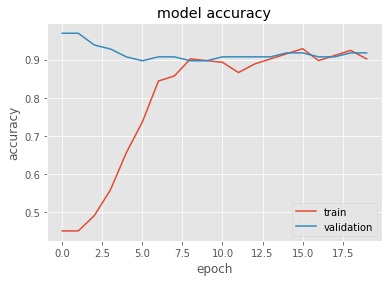

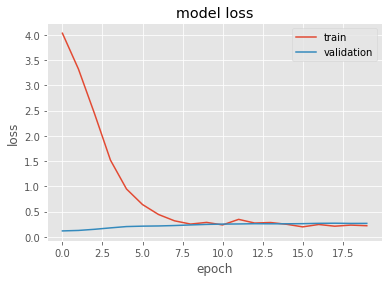

In [ ]:
import matplotlib.pyplot as plt

# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

### Results (fine tuning)

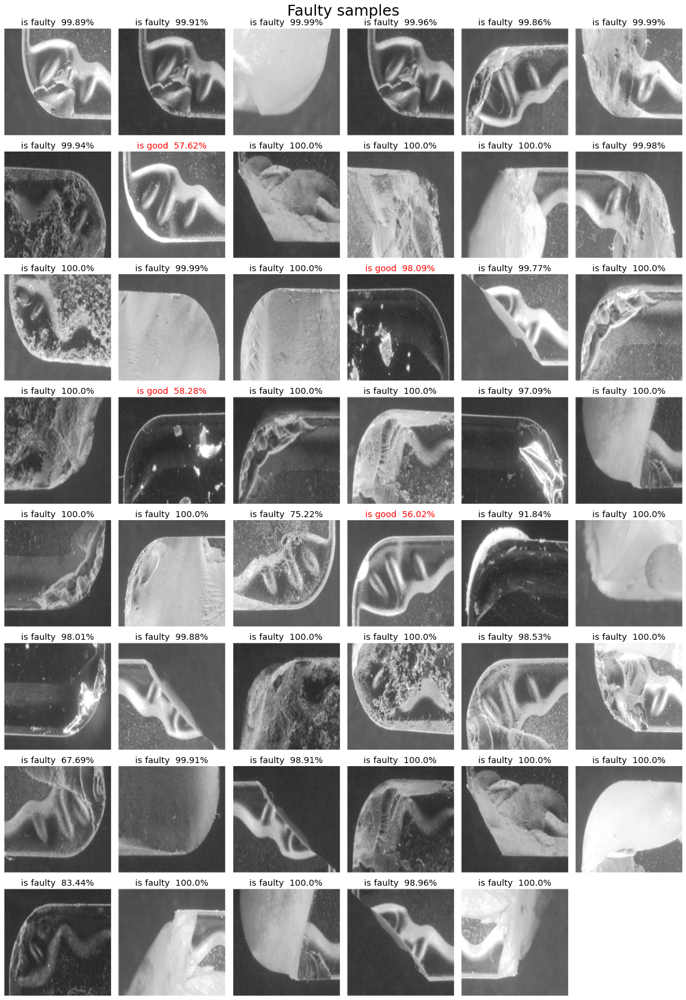

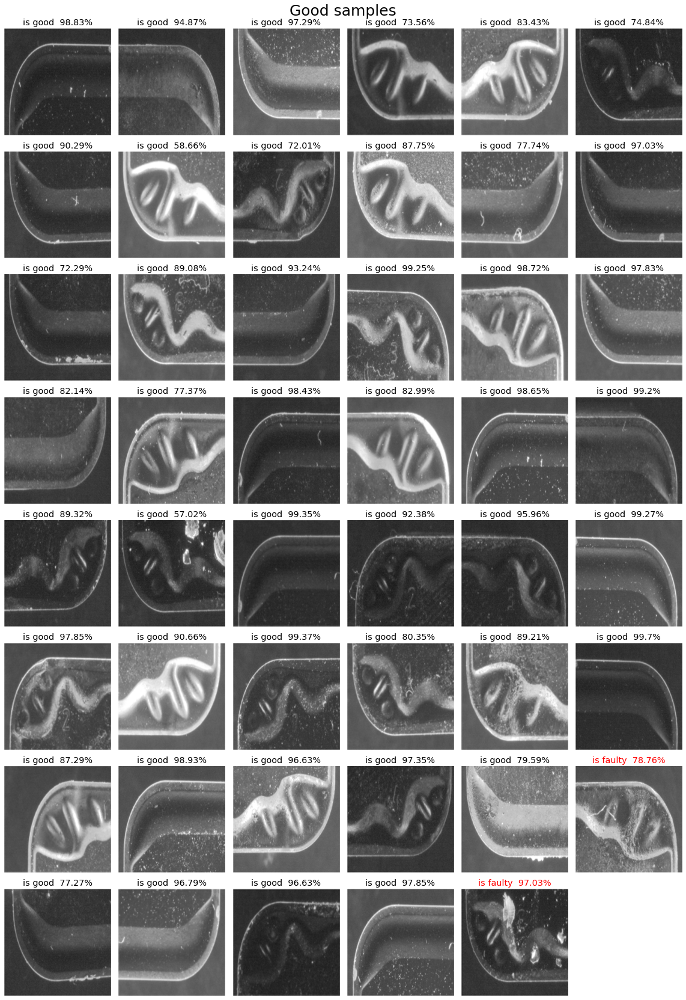

In [ ]:
false_faulty_identification = 0 
true_faulty_identification = 0 
n_cols = 6
n_rows = int(len(next_faulty_pix)/n_cols + n_cols)
fig = plt.gcf()
fig.set_size_inches(n_cols * 3, n_rows * 3)

for i, img_path in enumerate(next_faulty_pix):
  if classification[i] > 0.5:
    title =  "is good  " + str(round(float((classification[i])*100),2)) + "%"
    params = {"text.color" : "red"}
    plt.rcParams.update(params)
    false_faulty_identification += 1
  else:
    title =  "is faulty  " + str(round(float((1-classification[i])*100),2)) + "%"
    params = {"text.color" : "black"}
    plt.rcParams.update(params)
    true_faulty_identification +=1
 
  sp = plt.subplot(n_rows, n_cols, i + 1)
  sp.title.set_text(title)
  sp.axis('Off') # Don't show axes (or gridlines)
  img = mpimg.imread(img_path)
  plt.imshow(img)

params = {"text.color" : "black"}
plt.rcParams.update(params)
fig.suptitle("Faulty samples",fontsize=25)
plt.tight_layout(pad=8,w_pad=0.5, h_pad=1.0)
plt.show()

false_good_identification = 0
true_good_identification = 0
n_cols = 6
n_rows = int(len(next_good_pix)/n_cols + n_cols)
fig = plt.gcf()
fig.set_size_inches(n_cols * 3, n_rows * 3)

for j, img_path in enumerate(next_good_pix):
  

  if classification[j+i+1] > 0.5:
    true_good_identification +=1
    title =  "is good  " + str(round(float((classification[j+i+1])*100),2)) + "%"
    params = {"text.color" : "black"}
    plt.rcParams.update(params)
  else:
    title =  "is faulty  " + str(round(float((1-classification[j+i+1])*100),2)) + "%"
    false_good_identification +=1
    params = {"text.color" : "red"}
    plt.rcParams.update(params)
  
  sp = plt.subplot(n_rows, n_cols, j + 1)
  sp.title.set_text(title)
  sp.axis('Off') # Don't show axes (or gridlines)
  img = mpimg.imread(img_path)
  plt.imshow(img)

params = {"text.color" : "black"}
plt.rcParams.update(params)
fig.suptitle("Good samples",fontsize=25)
plt.tight_layout(pad=8,w_pad=0.5, h_pad=1.0)
plt.show()

### Results chart (fine tuning)

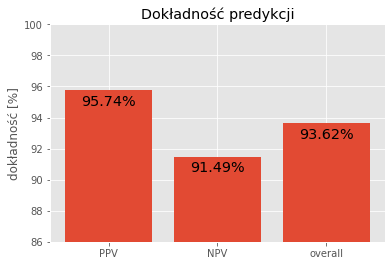

In [ ]:
# function to add value labels
def addlabels(x,y):
    for i in range(len(x)):
        y_txt = "{:.2f}%".format(y[i])
        plt.text(i, y[i]-1, y_txt, ha = 'center', fontsize="x-large")

plt.style.use('ggplot')

x = ['PPV', 'NPV', 'overall']
precent = [PPV,NPV,accuracy]

x_pos = [i for i, _ in enumerate(x)]

fig = plt.bar(x_pos, precent)
plt.ylabel("dokładność [%]")
plt.title("Dokładność predykcji")
plt.ylim(int(min(PPV,NPV)-5),100)
plt.xticks(x_pos, x)
addlabels(x, precent)


plt.show()



# Model structure

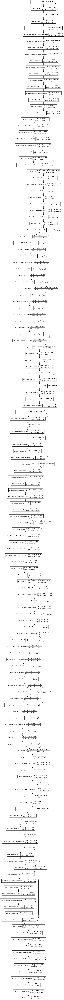

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(base_model, to_file='conv_base.png', show_shapes=True)
from IPython.display import Image
Image(filename='conv_base.png') 

# Manual tests

In [ ]:
uploaded = files.upload()

KeyboardInterrupt: ignored

In [ ]:

# TESTING NEW IMAGES - NEED TO UPDATE IT
import numpy as np
from google.colab import files
from keras.preprocessing import image
import cv2 as cv

for fn in uploaded.keys():
  # predicting images
  path = '/content/' + fn
  img = cv.imread(path, cv.IMREAD_UNCHANGED)
  x = cv.resize(img, (150,150))[None, ...] / 255
  # x /= 255
  print(img.shape)
  # img = image.load_img(path, target_size=(150, 150))
  # x = image.img_to_array(img)
  # x = np.expand_dims(x, axis=0)
  # x/=255

  image_tensor = np.vstack([x])
  classes = model.predict(image_tensor)
  print(classes)
  print(classes[0])
  if classes[0]>0.5:
    print(fn + " is good")
  else:
    print(fn + " is faulty")
 

# Load & Save model

In [ ]:
model = keras.models.load_model('/content/drive/MyDrive/cutting-inserts-samples/model_mobilenet')

In [ ]:
model.save('/content/drive/MyDrive/cutting-inserts-samples/model_mobilenet')

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


INFO:tensorflow:Assets written to: /content/drive/MyDrive/cutting-inserts-samples/model_mobilenet/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/cutting-inserts-samples/model_mobilenet/assets
